In [1]:
pip install emgdecomp

   ---------------------------------------- 0.0/2.8 MB ? eta -:--:--
   ---------------------------------------- 2.8/2.8 MB 18.2 MB/s eta 0:00:00
   ---------------------------------------- 0.0/30.3 MB ? eta -:--:--
   ---------- ----------------------------- 7.6/30.3 MB 39.0 MB/s eta 0:00:01
   ---------- ----------------------------- 7.6/30.3 MB 39.0 MB/s eta 0:00:01
   ---------- ----------------------------- 7.6/30.3 MB 39.0 MB/s eta 0:00:01
   ---------- ----------------------------- 7.6/30.3 MB 39.0 MB/s eta 0:00:01
   --------------- ------------------------ 11.8/30.3 MB 11.4 MB/s eta 0:00:02
   ----------------------- ---------------- 17.6/30.3 MB 14.2 MB/s eta 0:00:01
   ------------------------------- -------- 24.1/30.3 MB 16.6 MB/s eta 0:00:01
   ---------------------------------------  30.1/30.3 MB 18.2 MB/s eta 0:00:01
   ---------------------------------------- 30.3/30.3 MB 17.5 MB/s eta 0:00:00
Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 24.3.1 -> 25.0
[notice] To update, run: python.exe -m pip install --upgrade pip


In [ ]:
pip install matplotlib

In [1]:
import pandas as pd
from scipy.io import loadmat
from scipy.signal import butter, filtfilt, iirnotch
import numpy as np
import matplotlib.pyplot as plt
import numpy as np
np.int = int  
np.float = float  

In [2]:
def notch_filter(data, f0=60.0, fs=500, Q=30):
    """Applies a notch filter to the data to remove 60 Hz interference."""
    b, a = iirnotch(f0, Q, fs)
    return filtfilt(b, a, data)

In [3]:
def butter_bandpass(lowcut, highcut, fs, order=4):
    """Designs a Butterworth bandpass filter."""
    nyquist = 0.5 * fs
    low = lowcut / nyquist
    high = highcut / nyquist
    b, a = butter(order, [low, high], btype='band')
    return b, a

In [4]:
def bandpass_filter(data, lowcut, highcut, fs, order=4):
    """Applies a Butterworth bandpass filter to the data."""
    b, a = butter_bandpass(lowcut, highcut, fs, order)
    return filtfilt(b, a, data)

In [5]:
def moving_window_rms(signal, window_size):
        """Compute windowed RMS of the signal."""
        return np.sqrt(np.convolve(signal ** 2, np.ones(window_size) / window_size, mode='same'))

In [8]:
def process_single_session(df_data, num_channels=8, fs=500): 
    # df_data = pd.read_csv(file_path)

    filtered_signals = []
    for i in range(num_channels):
        channel_data = df_data.iloc[:, i].values
        notched = notch_filter(channel_data, f0=60, fs=500)
        filtered_data = bandpass_filter(notched, lowcut=8, highcut=248, fs=fs)
        filtered_data = moving_window_rms(filtered_data, 200)
        filtered_signals.append(filtered_data)

    # Convert the filtered signals to a DataFrame
    filtered_signals = pd.DataFrame(filtered_signals).T  # Transpose to align channels as columns
    # rms_signals = filtered_signals.apply(lambda x: moving_window_rms(x, 200), axis=0)  # Apply RMS channel-wise

    # Create a DataFrame for filtered and RMS data
    filtered_signals.columns = [f"Channel {i+1}" for i in range(num_channels)]

    # Plot the filtered signals
    fig, axes = plt.subplots(num_channels, 1, figsize=(10, 12), sharex=True)
    fig.suptitle("Filtered EMG Data (10-500 Hz Bandpass and 60 Hz Notch)", fontsize=16)

    for i in range(num_channels):
        axes[i].plot(filtered_signals.iloc[:, i], label=f'Channel {i + 1}', linewidth=0.7)
        axes[i].set_title(f'Channel {i + 1}')
        axes[i].set_ylabel("Amplitude")
        axes[i].grid(True)
        axes[i].legend()
        axes[i].relim()
        axes[i].autoscale_view()

    axes[-1].set_xlabel("Time Points")
    plt.tight_layout(rect=[0, 0, 1, 0.96])
    plt.show()

    return filtered_signals

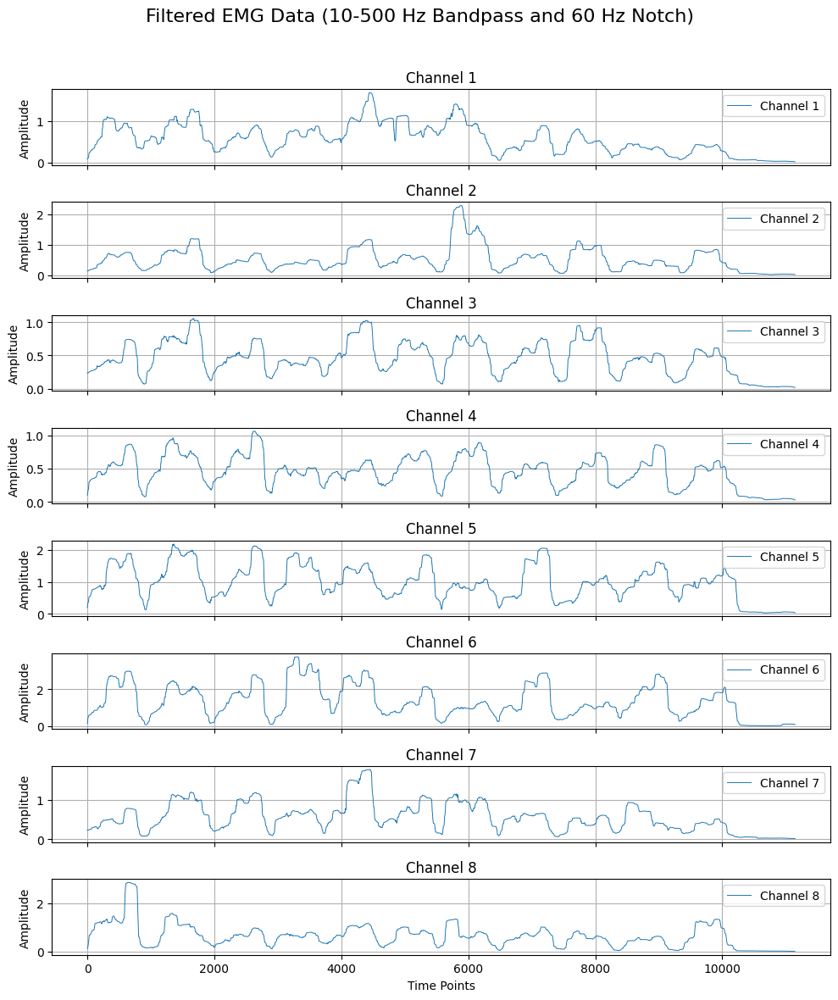

,Channel 1,Channel 2,Channel 3,Channel 4,Channel 5,Channel 6,Channel 7,Channel 8
0,0.081293,0.145586,0.236601,0.101599,0.192588,0.155840,0.226902,0.138891
1,0.083510,0.146093,0.236632,0.101629,0.198917,0.160307,0.227307,0.139497
2,0.086246,0.147008,0.236701,0.101676,0.205495,0.165333,0.227544,0.140094
3,0.088074,0.147762,0.236817,0.102174,0.214583,0.171322,0.227995,0.141341
4,0.088076,0.147806,0.236884,0.107635,0.233085,0.194023,0.228077,0.144254
...,...,...,...,...,...,...,...,...
11141,0.019478,0.027795,0.021605,0.030578,0.034085,0.087124,0.013956,0.010065
11142,0.019239,0.027554,0.021557,0.027572,0.031347,0.083126,0.013928,0.010023
11143,0.019127,0.027401,0.021547,0.026279,0.030308,0.082338,0.013919,0.009894
11144,0.019081,0.027175,0.021502,0.025558,0.029917,0.082330,0.013912,0.009845


In [14]:
data = pd.read_csv("D:\CMU_NML\Mindrove_venv\Smart_select_WExten_data_2025_03_21_0.csv")
process_single_session(data)

DECOMP >>>>

In [7]:
from scipy.io import loadmat

In [9]:
Signal_luigi_tmsi_df = pd.DataFrame(Signal_luigi_tmsi)
Signal_luigi_tmsi_df

NameError: name 'Signal_luigi_tmsi' is not defined

In [10]:
data_luigi = loadmat("C:\\Users\\dheem\\Downloads\\trial_1_FLX_Cleaned.mat")
Signal_luigi_tmsi = data_luigi["SIG"].flatten()

In [11]:
rows_list = []
for chan_tmsi in Signal_luigi_tmsi:
    
    chan_len = chan_tmsi[0]
    rows_list.append(chan_len.transpose())
blank_array = np.vstack(rows_list)

tmsi_df = pd.DataFrame(np.array(blank_array).transpose())
tmsi_df

,0,1,2,3,4,5,6,7,8,9,...,54,55,56,57,58,59,60,61,62,63
0,-0.884533,-1.058763,-0.829486,-1.079788,-1.714486,-2.669260,-3.921779,-3.930826,-1.472831,-0.459463,...,0.601460,1.577689,2.735890,2.621139,1.730351,1.182940,0.852342,1.390280,2.664581,2.250211
1,-5.142103,-1.621770,-2.215383,0.445373,-4.246854,-1.471213,-3.630574,0.899055,-2.403818,0.567909,...,-1.253699,-5.471281,14.252624,6.466456,5.974198,4.910651,0.933229,0.490993,-5.319052,-4.884406
2,-7.095097,-4.105253,-3.944545,0.880586,-3.123732,1.656829,-4.518214,1.345160,-4.603006,1.819608,...,-4.579806,-11.551834,30.767282,18.782049,13.005207,8.400757,1.822714,-4.017995,-13.049911,-8.099544
3,-4.959854,-5.342515,-3.483516,2.400774,1.742449,4.302534,-6.630263,-1.806560,-5.874023,3.370562,...,-8.294156,-14.725169,48.310560,35.224612,21.084736,11.408184,4.532693,-8.291601,-16.164582,-6.536416
4,-0.374544,-1.850724,1.033419,6.854045,7.393209,4.393640,-9.715128,-6.170687,-2.675579,5.462677,...,-10.186669,-14.473385,59.183376,44.849731,26.178443,13.824985,8.178371,-7.301298,-13.003347,-3.235497
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
106867,10.724571,17.843303,20.646385,13.073357,8.599256,1.354061,-2.894442,-3.026818,18.536169,40.625695,...,-25.765609,-5.655665,-11.888089,-15.295054,-18.173160,-16.534800,-26.834394,-24.326738,-25.846932,-18.420109
106868,6.271544,15.162685,19.300638,12.346974,9.911182,2.940301,-1.947726,0.859546,15.907092,35.309096,...,-21.557035,0.709259,-11.451907,-13.419167,-17.089214,-16.908026,-26.133388,-24.421415,-22.006102,-13.598459
106869,4.772232,12.462399,16.340633,10.872067,9.223380,3.157612,-1.714053,2.391909,13.251114,25.983371,...,-16.354308,4.099106,-9.627849,-11.185299,-14.266024,-15.909297,-22.298660,-19.018175,-15.823043,-8.006304
106870,5.283748,9.658351,11.806784,7.744635,5.986284,1.245244,-2.207133,0.303574,10.514251,17.417626,...,-10.838220,2.560312,-7.151448,-8.340467,-9.873138,-11.303817,-14.507291,-11.002687,-9.661672,-4.550358


C:\Users\dheem\AppData\Local\Temp\ipykernel_18308\1789497805.py:32: UserWarning: Tight layout not applied. tight_layout cannot make Axes height small enough to accommodate all Axes decorations.
  plt.tight_layout(rect=[0, 0, 1, 0.96])


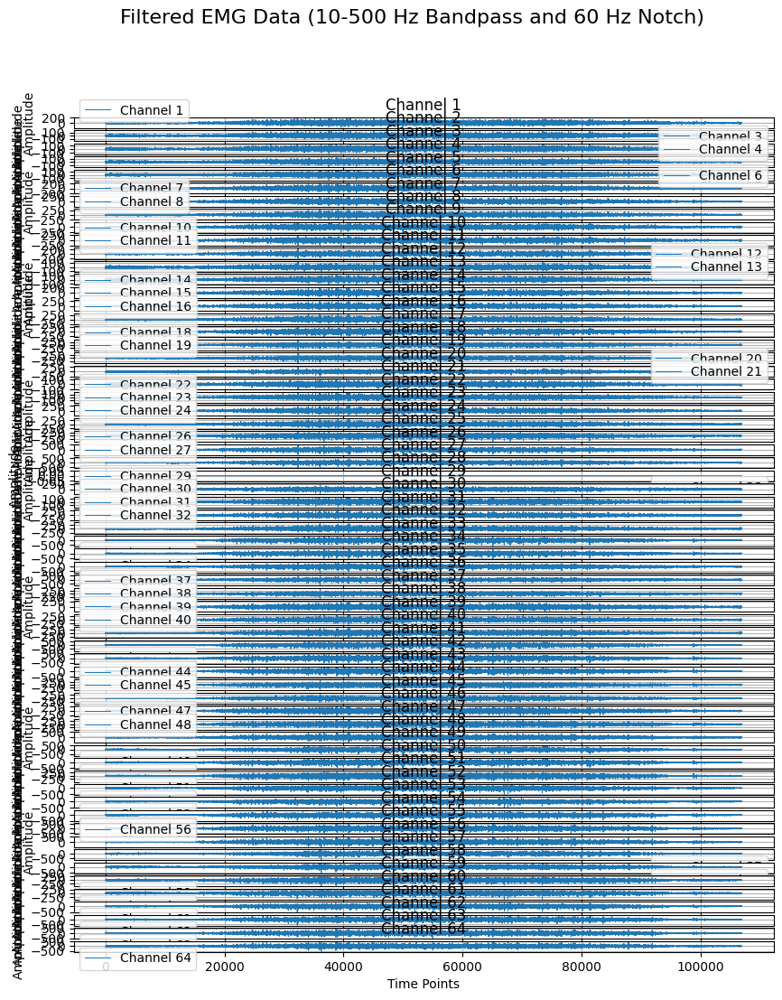

In [12]:
filtered_data = process_single_session(tmsi_df, 64, 2000)

In [13]:
np.array(filtered_data).shape

(106872, 64)

In [14]:
np.array(filtered_data).shape

(106872, 64)

In [15]:
# Monkey-patch compute_percentage_coincident
from scipy import stats
from emgdecomp.decomposition import *
def compute_percentage_coincident(spike_train_1, spike_train_2):
    distances = np.abs(spike_train_1[:, None] - spike_train_2).min(axis=1)
    mode, _ = stats.mode(distances)
    mode = mode[0] if isinstance(mode, np.ndarray) else mode
    counts = np.sum((distances == mode) | (distances == mode + 1) | (distances == mode - 1))
    return counts / max(len(spike_train_1), len(spike_train_2))

# Update the method in emgdecomp
import emgdecomp.decomposition
emgdecomp.decomposition.compute_percentage_coincident = compute_percentage_coincident


In [16]:
from emgdecomp.parameters import EmgDecompositionParams
from emgdecomp.plots import plot_firings

In [17]:
decomp = EmgDecomposition(
  params=EmgDecompositionParams(
    sampling_rate =2000,
    extension_factor = 16,
    maximum_num_sources = 25,
    min_peaks_distance_ms = 15,
    contrast_function = 'logcosh',
    max_iter = 100,
    convergence_tolerance = 1e-4,
    sil_threshold = 0.85,
    regularization_method  = 'truncate', # truncate
    improvement_iteration_metric = 'isi', # 'sil', 'isi', 'csm1', 'csm3'
    davies_bouldin_threshold = 0.2,
    source_acceptance_metric = 'sil',
    regularization_factor_eigvals = 0.5,
  
    firings_similarity_metric = 'perc_coincident',
    max_similarity = 0.3,
    min_n_peaks = 20,
    fraction_peaks_initialization = 0.75,
    # w_init_indices = None,
    improvement_iteration_min_peak_heights = None,
    waveform_duration_ms = 20.0,
    pre_spike_waveform_duration_ms = 10.0,
    clustering_algorithm = 'kmeans', # kmeans
    # dask_chunk_size_samples = 100000, 
    sil_max_samples = -1
  ))

firings = decomp.decompose(np.array(filtered_data.transpose()))
print(firings)

before whitened


KeyboardInterrupt: 

In [153]:
from scipy.io import savemat

savemat('firings_data.mat', {'firings': firings})

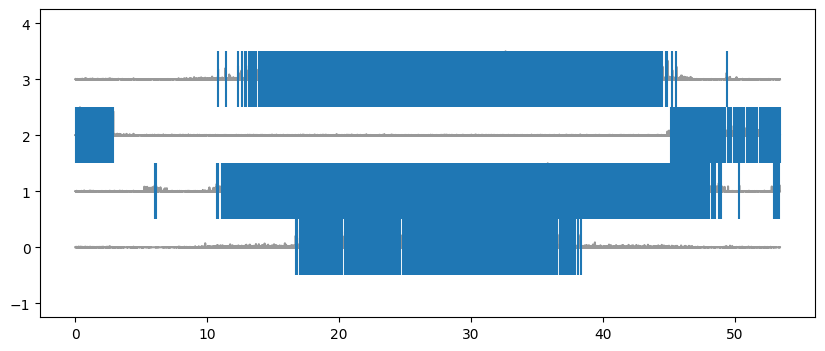

In [149]:
plot_firings(decomp, np.array(filtered_data.transpose()), firings)

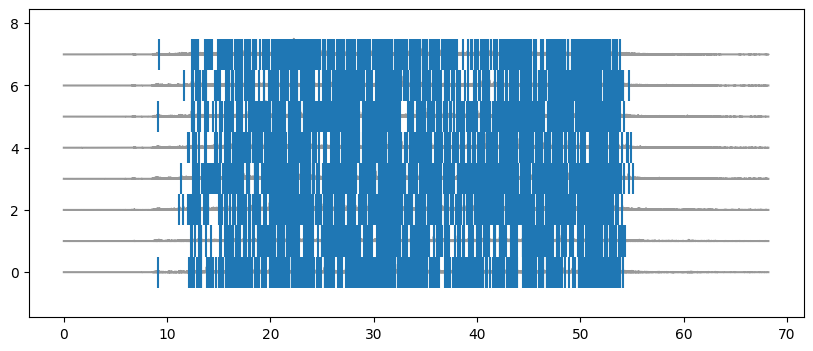

In [56]:
plot_firings(decomp, np.array(filtered_data.transpose()), firings)

In [150]:
muaps = decomp.muap_waveforms(data=np.array(filtered_data.transpose()), firings=firings, waveform_duration_ms=30)
for key in muaps:
    print(f"MUAP shape for key {key}: {muaps[key].shape}")
    print(f"MUAP size for key {key}: {muaps[key].size}")

MUAP shape for key 0: (250, 64, 60)
MUAP size for key 0: 960000
MUAP shape for key 1: (636, 64, 60)
MUAP size for key 1: 2442240
MUAP shape for key 2: (124, 64, 60)
MUAP size for key 2: 476160
MUAP shape for key 3: (471, 64, 60)
MUAP size for key 3: 1808640


In [57]:
muaps = decomp.muap_waveforms(data=np.array(filtered_data.transpose()), firings=firings, waveform_duration_ms=30)
for key in muaps:
    print(f"MUAP shape for key {key}: {muaps[key].shape}")
    print(f"MUAP size for key {key}: {muaps[key].size}")

MUAP shape for key 0: (474, 8, 15)
MUAP size for key 0: 56880
MUAP shape for key 1: (355, 8, 15)
MUAP size for key 1: 42600
MUAP shape for key 2: (441, 8, 15)
MUAP size for key 2: 52920
MUAP shape for key 3: (563, 8, 15)
MUAP size for key 3: 67560
MUAP shape for key 4: (422, 8, 15)
MUAP size for key 4: 50640
MUAP shape for key 5: (472, 8, 15)
MUAP size for key 5: 56640
MUAP shape for key 6: (394, 8, 15)
MUAP size for key 6: 47280
MUAP shape for key 7: (431, 8, 15)
MUAP size for key 7: 51720


In [155]:
savemat('muaps_data.mat', {'muaps': muaps})

In [151]:
import numpy as np
import matplotlib.pyplot as plt

def Plot_Muaps(muaps, grid_shape=(2, 4), plot_individual=True):
    """
    Plot the MUAP waveforms for each decomposition key.

    Parameters
    ----------
    muaps : dict
        Dictionary where each key corresponds to a MUAP array of shape
        (n_waveforms, n_channels, waveform_length).
    grid_shape : tuple of int, optional
        The (n_rows, n_cols) for the subplot grid. For example, (2,4) for 8 channels.
    plot_individual : bool, optional
        If True, plot individual waveforms with transparency.
    """
    n_rows, n_cols = grid_shape

    for key in muaps:
        data = muaps[key]
        n_waveforms, n_channels, waveform_length = data.shape

        # Check if grid_shape matches the number of channels.
        if n_rows * n_cols != n_channels:
            raise ValueError(f"Grid shape {grid_shape} does not match number of channels ({n_channels}).")

        fig, axs = plt.subplots(n_rows, n_cols, figsize=(n_cols * 4, n_rows * 3))
        axs = axs.flatten()

        for ch in range(n_channels):
            ax = axs[ch]

            # Plot individual waveforms (if desired)
            if plot_individual:
                for wf in data[:, ch]:
                    ax.plot(wf, color='gray', alpha=0.3)

            # Plot the average waveform for this channel
            avg_wf = data[:, ch].mean(axis=0)
            ax.plot(avg_wf, color='blue', linewidth=2)

            ax.set_title(f"Key {key} - Ch {ch+1}")
            ax.set_xlabel("Time (samples)")
            ax.set_ylabel("Amplitude")
            ax.grid(True)

        plt.tight_layout()
        plt.show()



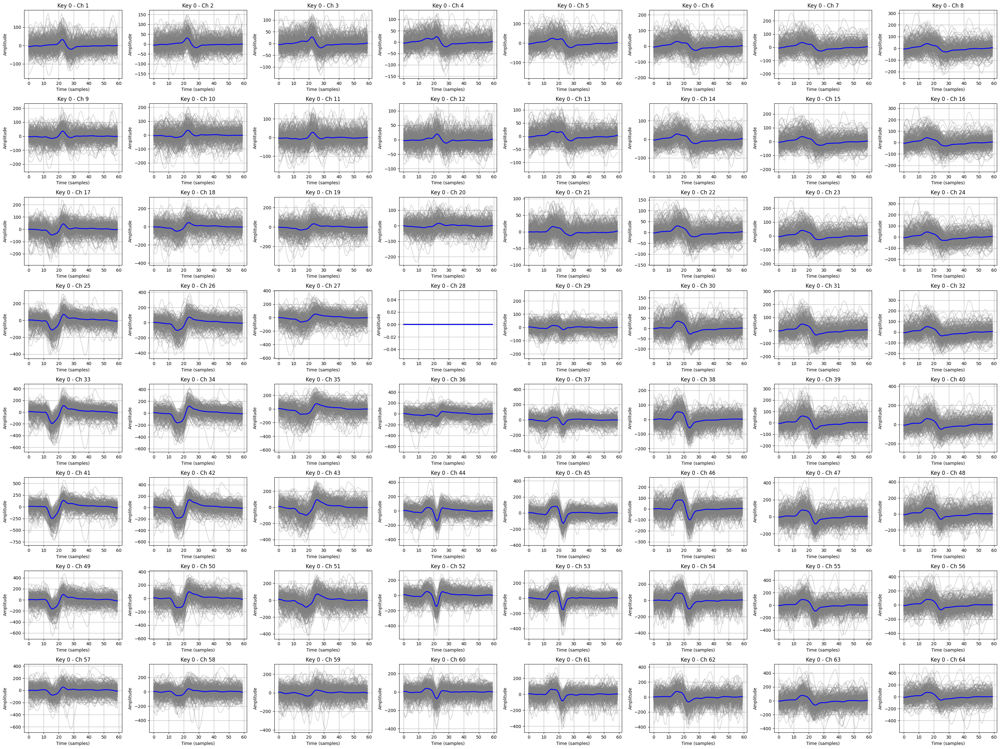

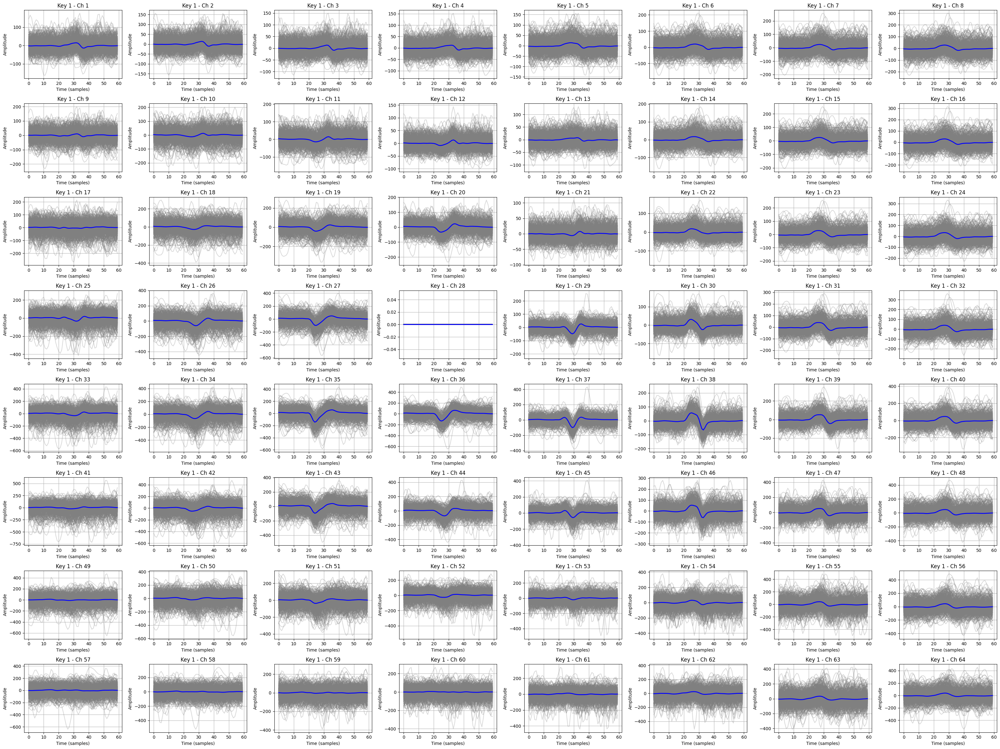

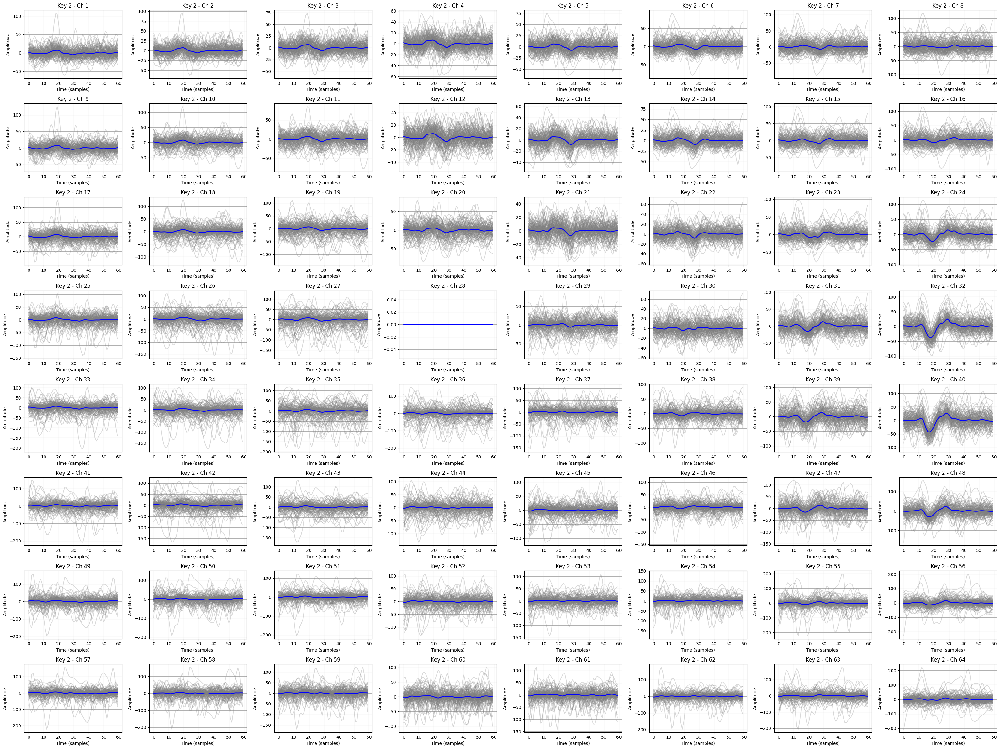

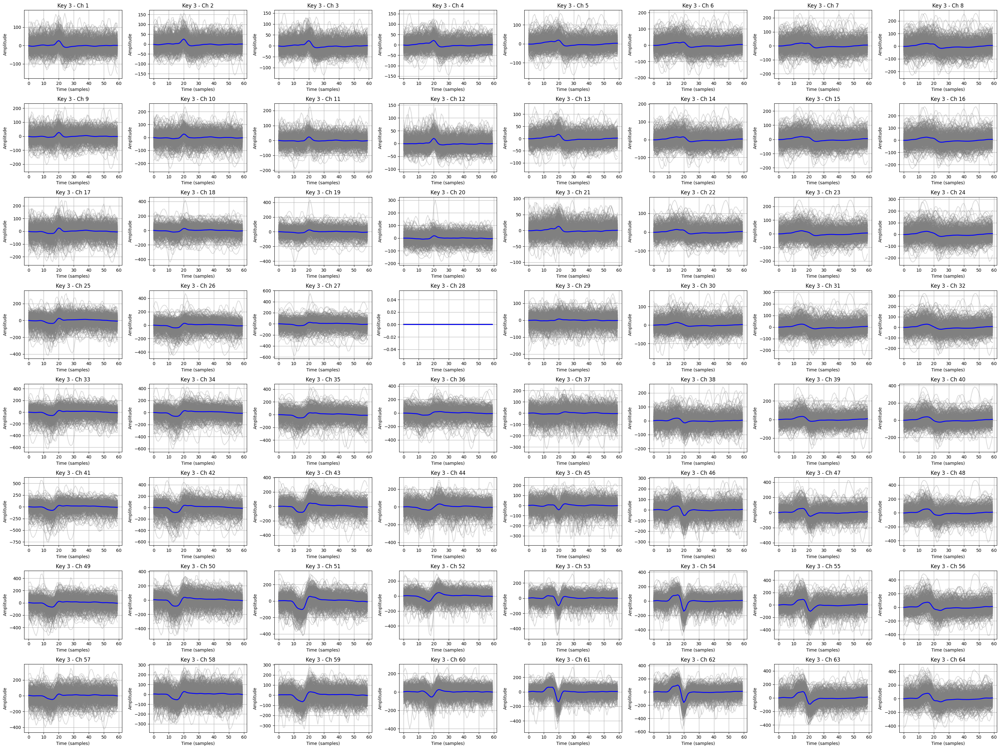

In [152]:
Plot_Muaps(muaps, grid_shape=(8, 8), plot_individual=True)

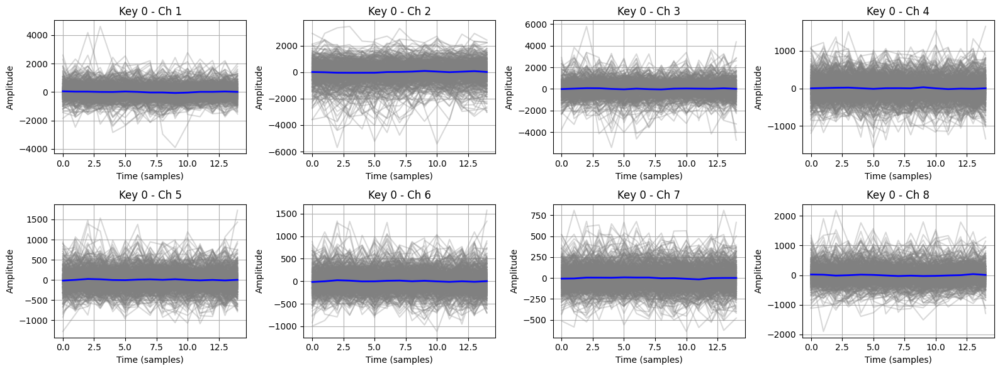

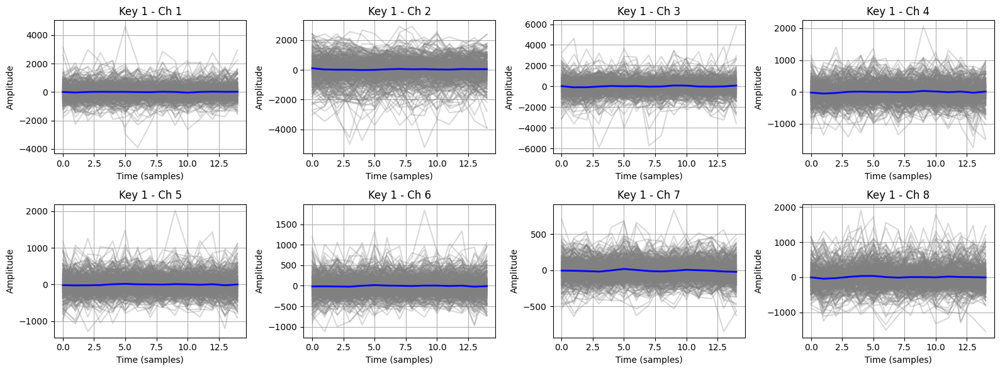

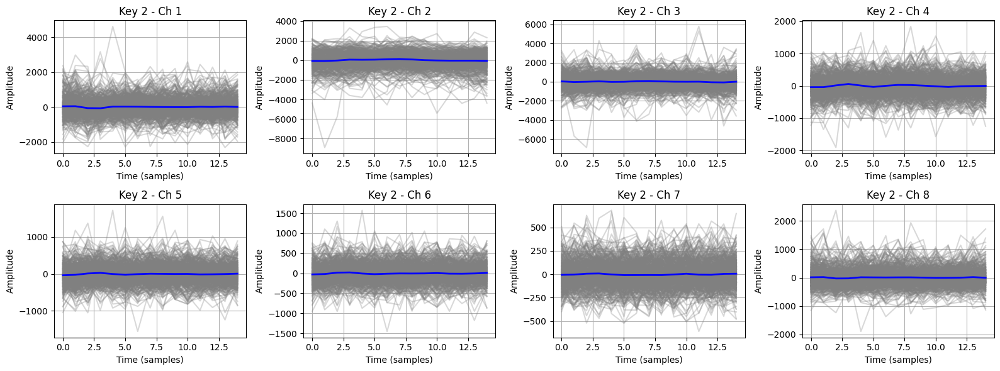

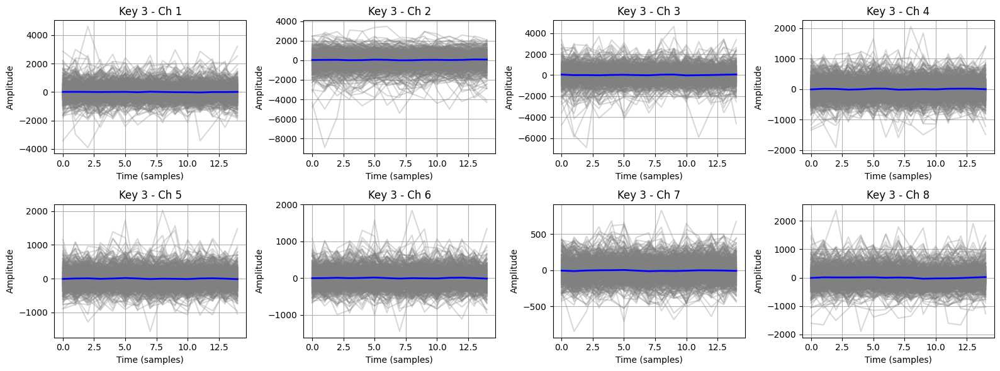

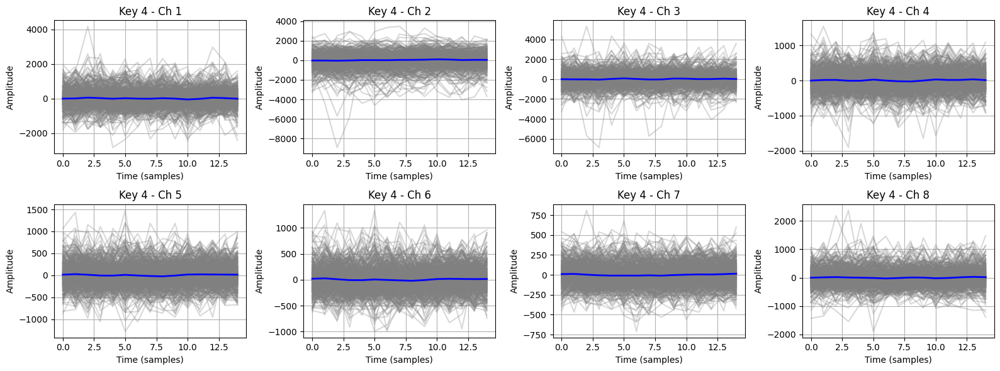

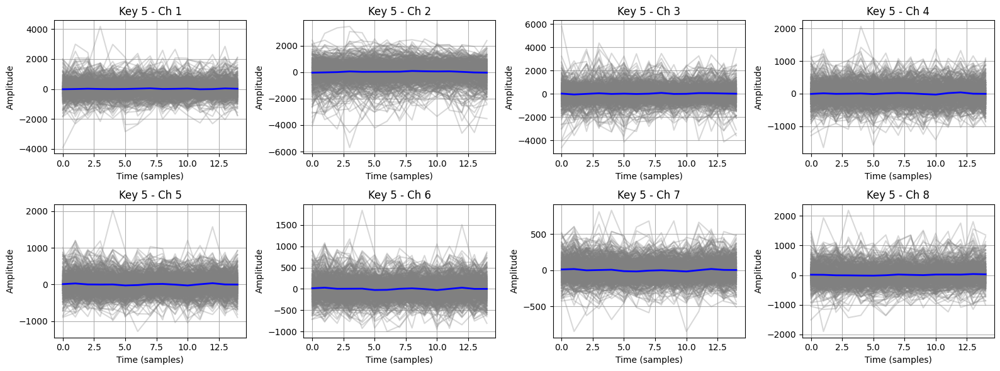

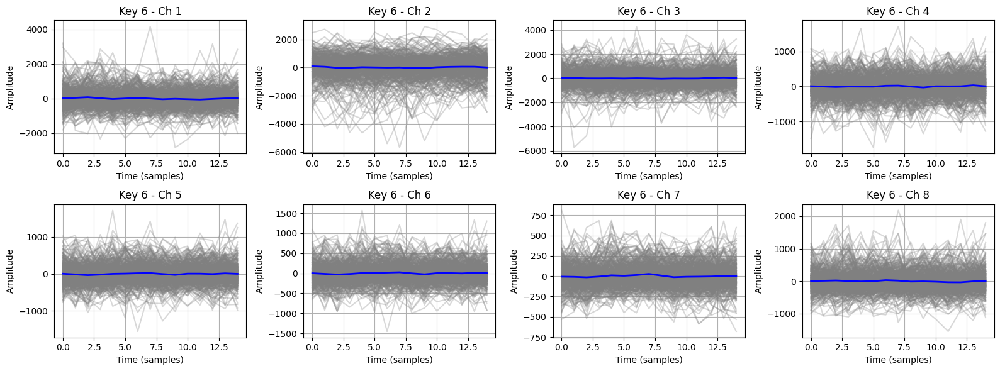

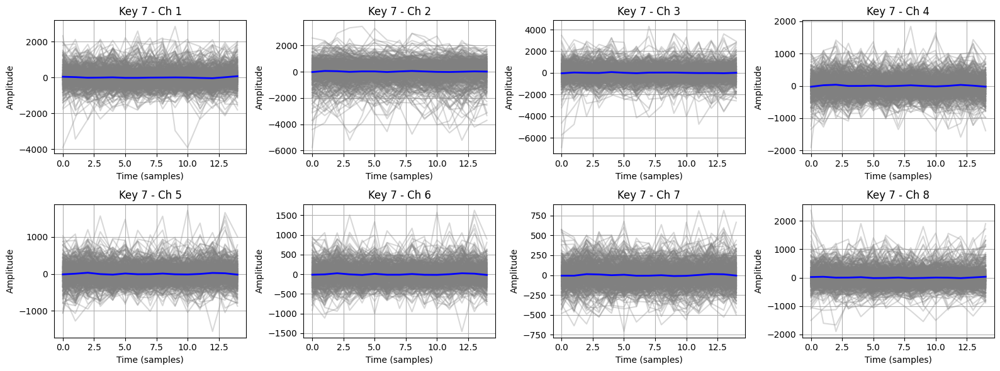

In [59]:
Plot_Muaps(muaps, grid_shape=(2, 4), plot_individual=True)